#**License Plate Recognition Project**

The purpose of our project is to take in an image of a vehicle and use deep learning techniques to recognize and extract the characters from the license plate of the vehilcle

Collaboators: Humyra Taifoor, Diljot Grewal, Tasfia Islam

**Importing Libraries**

In [ ]:
#importing relevant libraries
import numpy as np
import pandas as pd
import os
from matplotlib import pyplot as plt
import cv2 as cv
from google.colab import drive
import torchvision
from torchvision import datasets, transforms
import torch
from torch.utils.data import Dataset
import math

from PIL import Image


ImportError: ignored

**Importing Data**

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="lc8ldwPdYgtfdq1dm6bb")
project = rf.workspace("samrat-sahoo").project("license-plates-f8vsn")
dataset = project.version(3).download("yolov7")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.4/57.4 kB 645.1 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 155.3/155.3 kB 7.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 7.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 5.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.5/48.5 kB 4.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 4.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 21.1 MB/s eta 0:00:00
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9656 sha256=6e4a6ccaeef7a1465bce9f132328b2075ac1365845bcb31def37b144035de0be
  Stored in directory: /root/.cache/pip/wheels/8b/f1/7f/5c94f0a7a505ca1c81cd1d9208ae2064675d97582078e6c769
Successfully built wget
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.1.0
    Uninstalling pyparsing-3.1.0:
      S

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to License-Plates-3 in yolov7pytorch:: 100%|██████████| 712/712 [00:00<00:00, 2403.16it/s]


####**Data Processing**

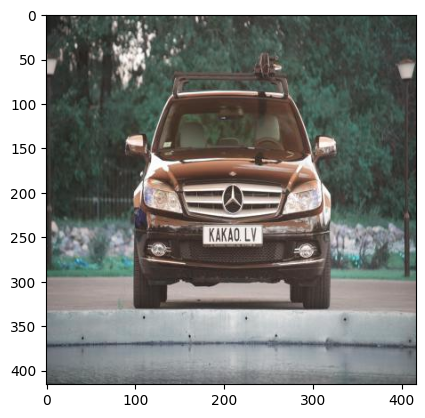

In [ ]:
#import images
#reference for the following code - https://discuss.pytorch.org/t/load-big-amount-of-unlabeled-images-and-predict-classes/132443"
train_paths = []
root_path_train = '/content/License-Plates-3/train/images/'



for subdir, dir,files in os.walk(root_path_train, topdown= True):
  for file in files:
    file_path = root_path_train + file
    train_paths.append(file_path)


img = cv.imread(train_paths[0])
plt.imshow(img)


In [ ]:
#importing the validation set
val_paths = []
root_path_val = '/content/License-Plates-3/valid/images/'

for subdir, dir,files in os.walk(root_path_val, topdown= True):
  for file in files:
    file_path = root_path_val + file
    val_paths.append(file_path)



In [ ]:

transform = transforms.ToTensor()

class OrigDataset(Dataset):
  def __init__(self,train_paths,transform):
    self.imlist = train_paths
    self.transform= transform

  def getitem(self,index):

    self.im = Image.open(self.imlist[index])

    self.image = self.transform(self.im)


    return self.image




In [ ]:
original_dataset = OrigDataset(train_paths,transform)

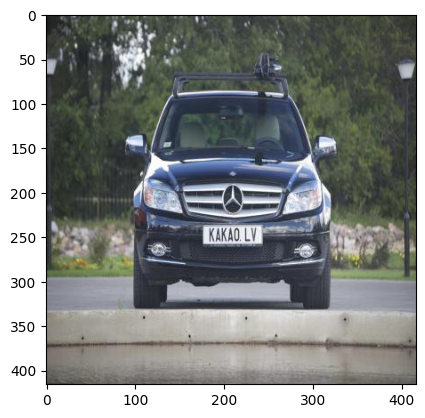

In [ ]:
origset=[]
j=0
for path in train_paths:
  ima= Image.open(train_paths[j])
  origset.append(ima)

plt.imshow(origset[0])

In [ ]:
#data augmentation function to generate new datasets
from google.colab import files

def DataAug(paths, transform):
  j=0
  aug_dataset =[]
  for path in paths:
    image = Image.open(paths[j])
    mod_img = transform(image)
    aug_dataset.append(mod_img)
    #files.download(mod_img)
    j= j +1

  return aug_dataset


In [ ]:
#different transforms to be used to generate new sets as per the proposal report
ccrop = transforms.CenterCrop(200)
gblur = transforms.GaussianBlur(5, sigma = (9,20))
invert_r = transforms.RandomInvert( p=0.5)
Jitter = transforms.ColorJitter(brightness = (0.5,2), contrast = 1, saturation = (0.5,3), hue = (-0.1,0.1))
grayscale = transforms.RandomGrayscale(p=1)
tensor = transforms.ToTensor()


In [ ]:
%cd /content/sample_data

/content/sample_data


Length: 245
Finished making cropset


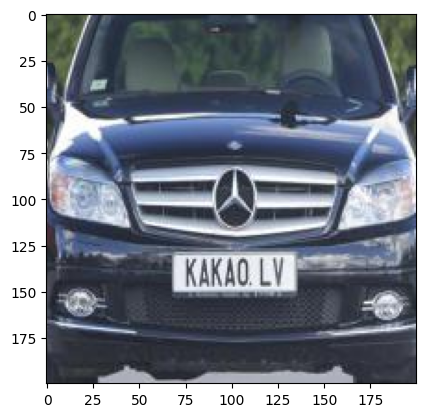

In [ ]:
#calling different transforms using the function and generating datasets
cropset = DataAug(train_paths, ccrop)
plt.imshow(cropset[0])
print("Length:", len(cropset))
print("Finished making cropset")


Length: 245


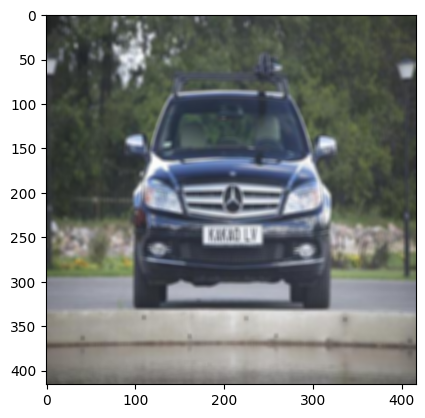

In [ ]:
gblurset = DataAug(train_paths, gblur)
plt.imshow(gblurset[0])
print("Length:", len(gblurset))

Length: 245


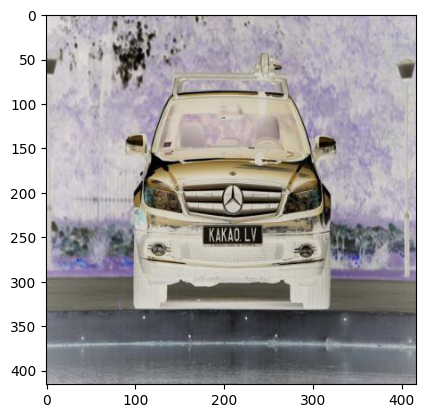

In [ ]:
invertset = DataAug(train_paths, invert_r)
plt.imshow(invertset[0])
print("Length:", len(invertset))

Length: 245


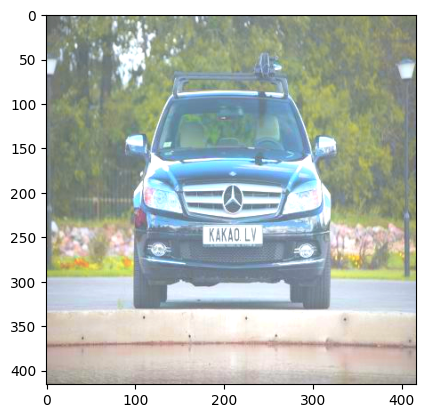

In [ ]:
jitterset = DataAug(train_paths, Jitter)
plt.imshow(jitterset[0])
print("Length:", len(jitterset))

Length: 245


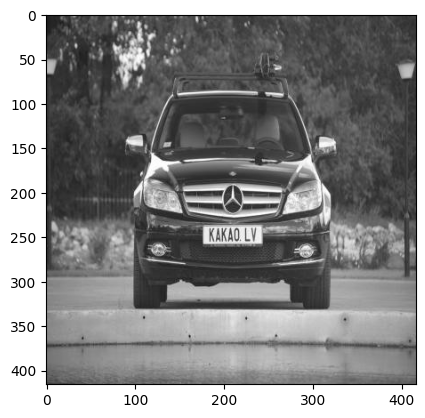

In [ ]:

grayset = DataAug(train_paths, grayscale)
plt.imshow(grayset[0])
print("Length:", len(grayset))

In [ ]:
#merging all the generated datasets
mega_dataset = origset+ cropset + gblurset + invertset + jitterset + grayset
print(len(mega_dataset))

1470


In [ ]:
from torch.utils.data.sampler import SubsetRandomSampler
#randomizing the dataset

np.random.seed(1000)

#indices = np.arange(len(mega_dataset))

np.random.shuffle(mega_dataset)

#train_sampler=SubsetRandomSampler(indices)


#train_loader = torch.utils.data.DataLoader(mega_dataset, batch_size = 30, num_workers = 1, sampler = train_sampler)



In [ ]:
%cd /content/sample_data

/content/sample_data


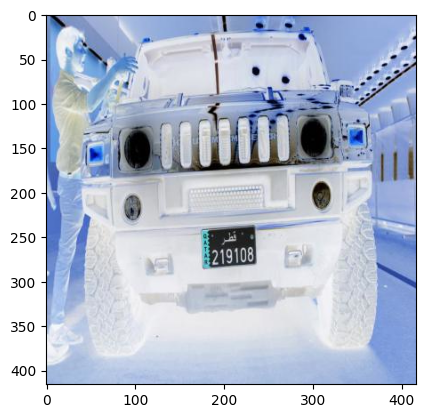

In [ ]:
for image in mega_dataset:
  plt.imshow(image)
  plt.savefig(f"{image}.jpg")

In [ ]:
print("Done saving all augmented images to local Google colab directory under the sample_data folder")

Done saving all augmented images to local Google colab directory under the sample_data folder


###**Baseline Model**

In [ ]:
#Baseline required Libraries
import glob
import os
import matplotlib.pyplot as plt

!sudo apt install tesseract-ocr
!pip install pytesseract
import pytesseract

!pip install opencv-contrib-python
!pip install imutils
import imutils

import cv2
from google.colab.patches import cv2_imshow

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 15 not upgraded.
Need to get 4,816 kB of archives.
After this operation, 15.6 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-eng all 1:4.00~git30-7274cfa-1.1 [1,591 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-osd all 1:4.00~git30-7274cfa-1.1 [2,990 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr amd64 4.1.1-2.1build1 [236 kB]
Fetched 4,816 kB in 2s (2,153 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debc

In [ ]:
#Additional code  Part 1 -> added on July 28 to mount drive to test images->saved
#in our project folder

#Mount drive

from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
#Additional code  Part 2 and last one.
import os
#Steps: In file directory at the left of Google collabe, go to gdrive folder then navigate and
#copy path of the folder APS360 Project - Group(i.e. the folder images.jpg is in)
#os.chdir('/content/gdrive/MyDrive/2023 Summer/APS360/APS360 Project - Group')
os.chdir('/content/gdrive/MyDrive/APS360/APS360 Project - Group')

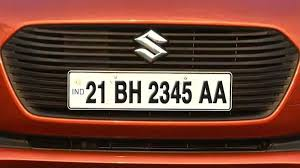

-1

In [ ]:
base_img1 = cv2.imread('/content/sample_data/<PIL.Image.Image image mode=RGB size=200x200 at 0x700RGB>.jpg')

base_img1 = imutils.resize(base_img1, width=300)
#from google collab import imshow
cv2_imshow(base_img1)
#wait
cv2.waitKey(0)


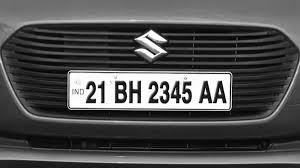

-1

In [ ]:
#gray scale
convert = cv2.COLOR_BGR2GRAY
img_gray = cv2.cvtColor(base_img1, convert)
cv2_imshow(img_gray)
#Key pressed
cv2.waitKey(0)

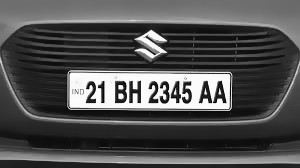

-1

In [ ]:
#Noise reduction
img_gray = cv2.bilateralFilter(img_gray, 11, 17, 17)
cv2_imshow(img_gray)
cv2.waitKey(0)

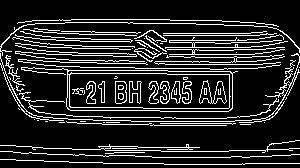

-1

In [ ]:
#Image->Detect edges

detectImg_edge = cv2.Canny(img_gray,30,200)
cv2_imshow(detectImg_edge)

cv2.waitKey(0)

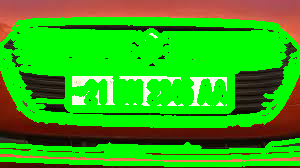

Contour Sorted in Descending order according to Cnt Areas:
The 30 conts at the top:


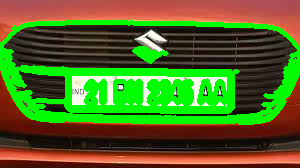

In [ ]:
#Image ->Contours from image edged#################

edge_copy1 = detectImg_edge.copy()
retrieve_contList = cv2.RETR_LIST
remove_repeatpts = cv2.CHAIN_APPROX_SIMPLE

contours,modif_img = cv2.findContours(edge_copy1, retrieve_contList, remove_repeatpts)
base_img2 = base_img1.copy()

cv2.drawContours(base_img2, contours, -1, (0,255,0),3)
cv2_imshow(base_img2)
cv2.waitKey(0)

#Contour->Sort #################################

print("Contour Sorted in Descending order according to Cnt Areas:")
cntArea = cv2.contourArea
contours = sorted(contours, key= cntArea, reverse=True)
#Choose first thirty elements
contours = contours[:30]
#Plate contour stored
str_cnt = None
base_img3 = base_img1.copy()
cv2.drawContours(base_img3, contours, -1, (0,255,0),3)
print("The 30 conts at the top:")
cv2_imshow(base_img3)
cv2.waitKey(0)

################## Contour 4 sides chosen  ##########
j = 7

for contvar in contours:
    #arc = cv2.arcLength(contvar, True)
    curve_approximate = cv2.approxPolyDP(contvar, 0.0180 * (cv2.arcLength(contvar, True)) ,True)
    #choose 4side cont
    if (len(curve_approximate)==4):
      str_cnt = curve_approximate
      #Crop rectangle
      topleft_x, topleft_y, width, ht = cv2.boundingRect(contvar)

      modified_sideimg = base_img1[topleft_y:topleft_y+ht, topleft_x:topleft_x+width]
      #save as img file
      cv2.imwrite('./'+ str(j) + '.jpg', modified_sideimg)
      j = j+1
      #Break out of loop
      break



In [ ]:
#Checking accuracy
if str_cnt is not None:
  acc = 1.0
else:
  acc = 0.0

print("Testing Acc if cont found indicator 1 else 0, found: ", acc)

Testing Acc if cont found indicator 1 else 0, found:  1.0


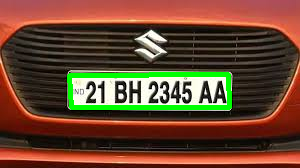

In [ ]:
#Draw chosen cont on image orig

if str_cnt is not None:

  cv2.drawContours(base_img1,[str_cnt], -1, (0,255,0), 3)
  cv2_imshow(base_img1)
  #wait
  cv2.waitKey(0)


Charaction Extraction:


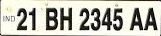

Licence plate found:  21 BH 2345 AA



In [ ]:
#Character Extract ###########################
print("Charaction Extraction:")
baseimg_cropped = './7.jpg'
#baseimg_cropped = "images.jpg"
#Display
cv2_imshow(cv2.imread(baseimg_cropped))

#Pass and extract
licpl = pytesseract.image_to_string(baseimg_cropped, lang='eng')
#Show output
print("Licence plate found: ", licpl)
cv2.waitKey(0)
#Shut all open windows
cv2.destroyAllWindows()

### **Primary Model**

Will be running GPU in Runtime.


Plotting two sample input images.

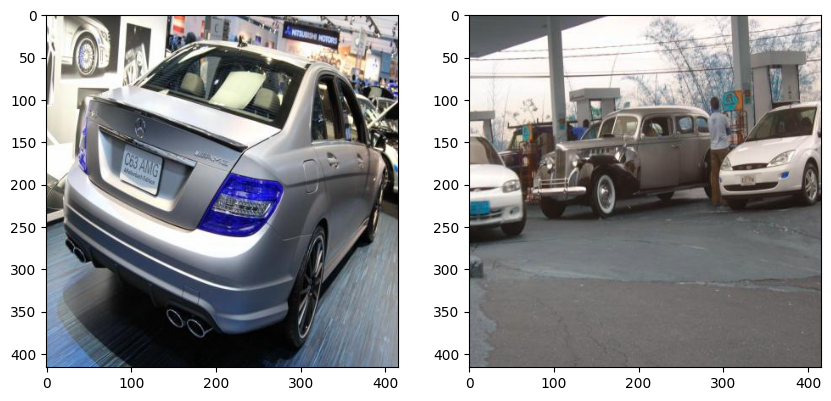

In [ ]:
fig,ax = plt.subplots(1,2,figsize=(10,5))
image1 = cv.imread("/content/License-Plates-3/train/images/003a5aaf6d17c917_jpg.rf.60e9d14047fc5cd445db13a7bb7264d4.jpg")
ax[0].imshow(image1)

image2 = cv.imread("/content/License-Plates-3/train/images/00723dac8201a83e_jpg.rf.d9a3c0ebd7bf1f3382b17ac4fb609474.jpg")
ax[1].imshow(image2)

Vehicle Detection using Yolov5:

In [ ]:
!git clone https://github.com/ultralytics/yolov5  # clone
%cd yolov5
%pip install -qr requirements.txt  # install

import torch
import utils
display = utils.notebook_init()  # checks


YOLOv5 🚀 v7.0-203-g0897415 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)


Setup complete ✅ (2 CPUs, 12.7 GB RAM, 24.4/78.2 GB disk)


train: /content/License-Plates-3/train/images
Note: Go into data.yaml in License-Plates-3 and change directory to be and add"/content/ to each line.

Training the yolov5s model using a batch of 16 and epochs of 150, using the dataset donwloaded.

In [ ]:
!python train.py --img 640 --batch 16 --epochs 150 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache
#!python train.py --img 640 --batch 16 --epochs 150 --source "/content/License-Plates-3/train/images" --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=/content/License-Plates-3/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=150, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-203-g0897415 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015

In [ ]:
#!pip uninstall tb-nightly tensorboardX tensorboard
#!pip install tensorboard

The below shows some performance metrics of part 1 of the primary model (training and validation curves).

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [ ]:
  #%reload_ext tensorboard

In [ ]:
!python detect.py --weights yolov5s.pt --img 640 --conf 0.25 --source "/content/License-Plates-3/valid/images" --save-txt
# display.Image(filename='runs/detect/exp/zidane.jpg', width=600)


detect: weights=['yolov5s.pt'], source=/content/License-Plates-3/valid/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-203-g0897415 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
image 1/70 /content/License-Plates-3/valid/images/d3729058c6a4186e_jpg.rf.7b93b9b84f702138e29c507a88bcdcf8.jpg: 640x640 3 persons, 2 cars, 12.3ms
image 2/70 /content/License-Plates-3/valid/images/d44c0b2252bf8a92_jpg.rf.0995fee700253a3ce0b78c661fff9c77.jpg: 640x640 1 parking meter, 12.5ms
image 3/70 /content/License-Plates-3/valid/images/d5058059dc0ce0ad_jp

Displaying a sample image after it has gone through vehicle detection:

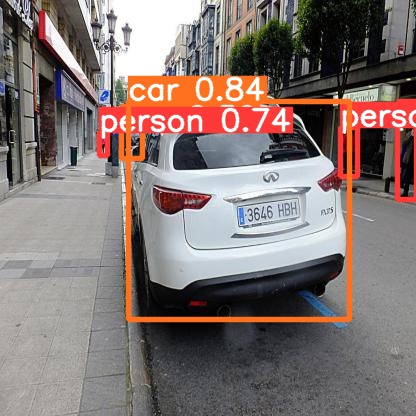

In [ ]:
display.Image(filename='/content/yolov5/runs/detect/exp/d3729058c6a4186e_jpg.rf.7b93b9b84f702138e29c507a88bcdcf8.jpg', width=600)

Cropping the image to only contain a vehicle.

In [ ]:
image1 = Image.open("/content/License-Plates-3/valid/images/d3729058c6a4186e_jpg.rf.7b93b9b84f702138e29c507a88bcdcf8.jpg")

import torch

# Model
model = torch.hub.load('ultralytics/yolov5', 'yolov5s', pretrained=True)

# Inference
results = model(image1)

# Results
#results.print()
#results.save()  # or .show()

# Data
print(results.xyxy[0])

print(results.xyxy[0][0][0:4])

crop_coordinates = results.xyxy[0][0][0:4]
coordinates_list  = crop_coordinates.tolist()

Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip
YOLOv5 🚀 v7.0-203-g0897415 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)



[Errno 2] No such file or directory: '/usr/local/lib/python3.10/dist-packages/pyparsing-3.1.0.dist-info/METADATA'


Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
Adding AutoShape... 


tensor([[127.72752, 101.18621, 349.38989, 318.61719,   0.83808,   2.00000],
        [339.64465, 126.64530, 357.46564, 176.43268,   0.75094,   0.00000],
        [ 98.76158, 132.22903, 107.05571, 155.04352,   0.74343,   0.00000],
        [397.05969, 123.65405, 416.00000, 199.25491,   0.70206,   0.00000],
        [121.35445, 128.92430, 142.30913, 158.09644,   0.58982,   2.00000]], device='cuda:0')
tensor([127.72752, 101.18621, 349.38989, 318.61719], device='cuda:0')


/content


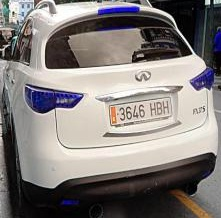

In [ ]:
%cd /content/
img = image1.crop(coordinates_list)
#image1[22.02912:58.36337, 399.03928:371.64505]
#img.save("new.jpg")
img = np.array(img)

cv.imwrite("new.jpg",img)
img = Image.open("/content/new.jpg")
#img
#plt.imshow(img)
#plt.axis("off")
#plt.show()
img.show()

The below code loops through all of the images that the previous step has outputted and crops the image to just include the vehicle. These are stored as seperate images.

In [ ]:
#cv.imread("/content/License-Plates-3/train/images/003a5aaf6d17c917_jpg.rf.60e9d14047fc5cd445db13a7bb7264d4.jpg")

i = 0
for filename in os.listdir("/content/yolov5/runs/detect/exp"):
    if filename.endswith("jpg"):
      i +=1
      %cd /content/yolov5/runs/detect/exp
      yolo_image = Image.open(filename)
      results = model(yolo_image)

      # Results
      #results.print()
      #results.save()  # or .show()
      #results.show()
      print(results.xyxy[0])
      if results.xyxy[0].numel() == 0:
        continue
      else:
        crop_coordinates = results.xyxy[0][0][0:4]
        coordinates_list  = crop_coordinates.tolist()
        yolo_image = yolo_image.crop(coordinates_list)
        yolo_image = np.array(yolo_image)
        %cd /content/License-Plates-3
        cv.imwrite(f"{filename}{i}.jpg",yolo_image)

     # f"{filename}part2.jpg"

/content/yolov5/runs/detect/exp
tensor([[6.01261e+01, 1.81980e+01, 3.41919e+02, 1.72739e+02, 5.82531e-01, 2.00000e+00],
        [4.72865e+01, 6.50159e-01, 3.49297e+02, 3.77658e+02, 3.27670e-01, 7.00000e+00],
        [7.09250e+01, 1.86110e+02, 3.37424e+02, 4.12379e+02, 2.63887e-01, 7.00000e+00]], device='cuda:0')
/content/License-Plates-3
/content/yolov5/runs/detect/exp
tensor([[335.92401,  13.17334, 414.49078, 112.56653,   0.41896,   5.00000]], device='cuda:0')
/content/License-Plates-3
/content/yolov5/runs/detect/exp
tensor([[127.27938,  97.93895, 350.90414, 310.16504,   0.70900,   2.00000]], device='cuda:0')
/content/License-Plates-3
/content/yolov5/runs/detect/exp
tensor([], device='cuda:0', size=(0, 6))
/content/yolov5/runs/detect/exp
tensor([], device='cuda:0', size=(0, 6))
/content/yolov5/runs/detect/exp
tensor([[2.39037e+01, 9.44867e+01, 3.97070e+02, 4.16000e+02, 2.89776e-01, 2.00000e+00],
        [2.59857e+02, 8.31849e+01, 4.15281e+02, 2.40165e+02, 2.75112e-01, 5.00000e+00]], d

Plotting some sample cropped pictures:

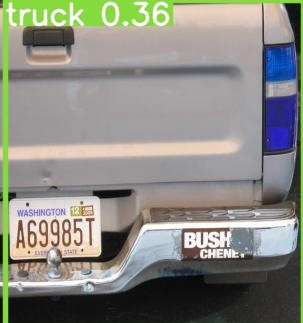

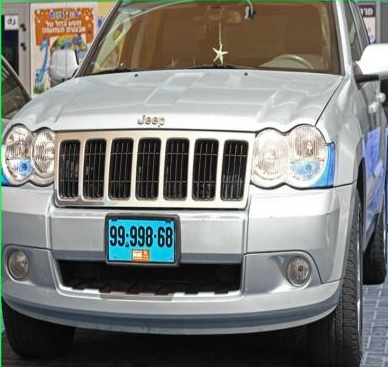

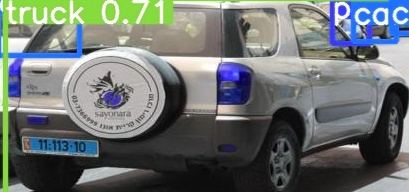

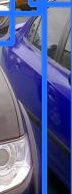

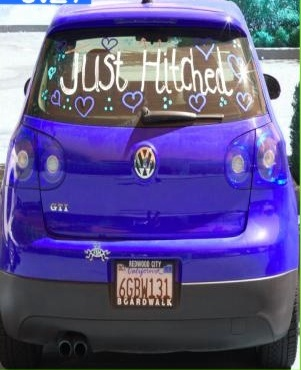

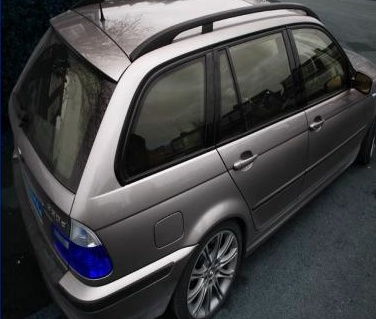

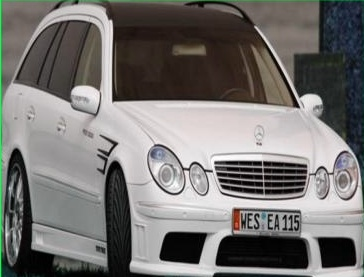

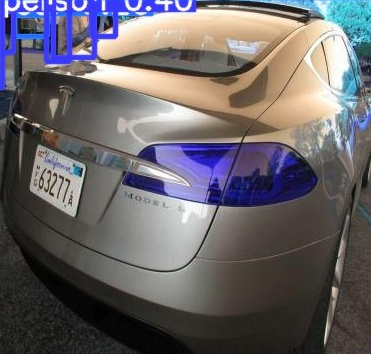

In [ ]:
i = 0
for filename in os.listdir("/content/License-Plates-3/"):
    i +=1
    if filename.endswith("jpg") and i<10:
        img_loop = Image.open(f"/content/License-Plates-3/{filename}")
        img_loop.show()
        img_loop = np.array(img_loop)
        plt.imshow(img_loop)
        #plt.axis("off")
        #plt.show()
        #img_loop.show()

**TESTING FOR PART 1**

In [ ]:
%cd /content/yolov5

/content/yolov5


In [ ]:
!python detect.py --weights yolov5s.pt --img 640 --conf 0.25 --source "/content/License-Plates-3/test/images" --save-txt

detect: weights=['yolov5s.pt'], source=/content/License-Plates-3/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-203-g0897415 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
image 1/35 /content/License-Plates-3/test/images/b15d6c0bdf90226d_jpg.rf.775557ba6aaf7d76a8d4bb04f66d8fc5.jpg: 640x640 1 car, 12.3ms
image 2/35 /content/License-Plates-3/test/images/b193070a9c45b5ab_jpg.rf.57e5987eb896a7bf9fc7a1a96a660c7e.jpg: 640x640 2 cars, 1 truck, 12.4ms
image 3/35 /content/License-Plates-3/test/images/b1a50a3824887ee2_jpg.rf.68a4fd34fce

Displaying a sample output image from testing data of part 1.

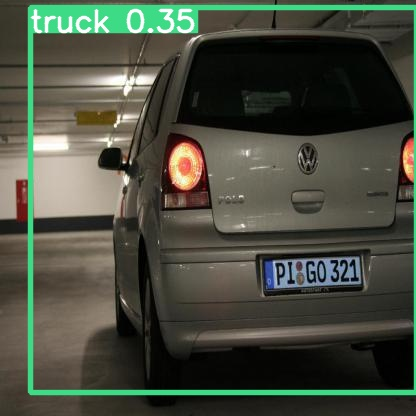

In [ ]:
display.Image(filename="/content/yolov5/runs/detect/exp2/cdb1e8621d1c624e_jpg.rf.b744b93a7af0771f1e5cb955155c8451.jpg", width=600)

Displaying a sample cropped output image from test data of part 1.

In [ ]:
image1 = Image.open("/content/yolov5/runs/detect/exp2/cdb1e8621d1c624e_jpg.rf.b744b93a7af0771f1e5cb955155c8451.jpg")

import torch

# Model
model = torch.hub.load('ultralytics/yolov5', 'yolov5s', pretrained=True)

# Inference
results = model(image1)

# Results
#results.print()
#results.save()  # or .show()

# Data
print(results.xyxy[0])

print(results.xyxy[0][0][0:4])

crop_coordinates = results.xyxy[0][0][0:4]
coordinates_list  = crop_coordinates.tolist()

Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 v7.0-203-g0897415 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 


[Errno 2] No such file or directory: '/usr/local/lib/python3.10/dist-packages/cycler-0.11.0.dist-info/METADATA'


YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
Adding AutoShape... 


tensor([[4.11683e+01, 1.96068e+01, 4.14741e+02, 3.78477e+02, 3.46482e-01, 7.00000e+00]], device='cuda:0')
tensor([ 41.16832,  19.60684, 414.74112, 378.47729], device='cuda:0')


/content


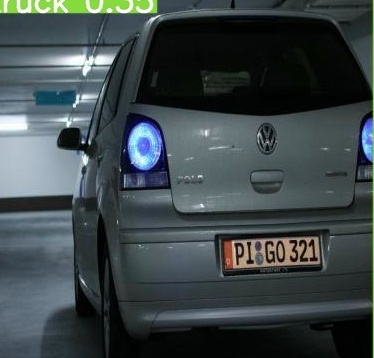

In [ ]:
%cd /content/
img = image1.crop(coordinates_list)
#image1[22.02912:58.36337, 399.03928:371.64505]
#img.save("new.jpg")
img = np.array(img)

cv.imwrite("new.jpg",img)
img = Image.open("/content/new.jpg")
#img
#plt.imshow(img)
#plt.axis("off")
#plt.show()
img.show()

License Plate Detection using Wpod-Net (Note that this is a pre-trained WPOD-NET model and the below code is taken from files from the github to ensure that the model works on the google colab):

In [ ]:
%cd /content/

/content


In [ ]:
#Credits for pre-trained WPOD-NET https://github.com/quangnhat185/Plate_detect_and_recognize/blob/master/%5BPart%201%5DLicense_plate_detection.ipynb

In [ ]:
!git clone https://github.com/quangnhat185/Plate_detect_and_recognize.git

Cloning into 'Plate_detect_and_recognize'...
remote: Enumerating objects: 180, done.
remote: Total 180 (delta 0), reused 0 (delta 0), pack-reused 180
Receiving objects: 100% (180/180), 50.59 MiB | 11.12 MiB/s, done.
Resolving deltas: 100% (69/69), done.


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from os.path import splitext,basename
from keras.models import model_from_json
import glob

The below is code from the local_utils file from the github.



In [ ]:
# pylint: disable=invalid-name, redefined-outer-name, missing-docstring, non-parent-init-called, trailing-whitespace, line-too-long
import cv2
import numpy as np


class Label:
    def __init__(self, cl=-1, tl=np.array([0., 0.]), br=np.array([0., 0.]), prob=None):
        self.__tl = tl
        self.__br = br
        self.__cl = cl
        self.__prob = prob

    def __str__(self):
        return 'Class: %d, top left(x: %f, y: %f), bottom right(x: %f, y: %f)' % (
        self.__cl, self.__tl[0], self.__tl[1], self.__br[0], self.__br[1])

    def copy(self):
        return Label(self.__cl, self.__tl, self.__br)

    def wh(self): return self.__br - self.__tl

    def cc(self): return self.__tl + self.wh() / 2

    def tl(self): return self.__tl

    def br(self): return self.__br

    def tr(self): return np.array([self.__br[0], self.__tl[1]])

    def bl(self): return np.array([self.__tl[0], self.__br[1]])

    def cl(self): return self.__cl

    def area(self): return np.prod(self.wh())

    def prob(self): return self.__prob

    def set_class(self, cl):
        self.__cl = cl

    def set_tl(self, tl):
        self.__tl = tl

    def set_br(self, br):
        self.__br = br

    def set_wh(self, wh):
        cc = self.cc()
        self.__tl = cc - .5 * wh
        self.__br = cc + .5 * wh

    def set_prob(self, prob):
        self.__prob = prob

class DLabel(Label):
    def __init__(self, cl, pts, prob):
        self.pts = pts
        tl = np.amin(pts, axis=1)
        br = np.amax(pts, axis=1)
        Label.__init__(self, cl, tl, br, prob)

def getWH(shape):
    return np.array(shape[1::-1]).astype(float)

def IOU(tl1, br1, tl2, br2):
    wh1, wh2 = br1-tl1, br2-tl2
    assert((wh1 >= 0).all() and (wh2 >= 0).all())

    intersection_wh = np.maximum(np.minimum(br1, br2) - np.maximum(tl1, tl2), 0)
    intersection_area = np.prod(intersection_wh)
    area1, area2 = (np.prod(wh1), np.prod(wh2))
    union_area = area1 + area2 - intersection_area
    return intersection_area/union_area

def IOU_labels(l1, l2):
    return IOU(l1.tl(), l1.br(), l2.tl(), l2.br())

def nms(Labels, iou_threshold=0.5):
    SelectedLabels = []
    Labels.sort(key=lambda l: l.prob(), reverse=True)

    for label in Labels:
        non_overlap = True
        for sel_label in SelectedLabels:
            if IOU_labels(label, sel_label) > iou_threshold:
                non_overlap = False
                break

        if non_overlap:
            SelectedLabels.append(label)
    return SelectedLabels



def find_T_matrix(pts, t_pts):
    A = np.zeros((8, 9))
    for i in range(0, 4):
        xi = pts[:, i]
        xil = t_pts[:, i]
        xi = xi.T

        A[i*2, 3:6] = -xil[2]*xi
        A[i*2, 6:] = xil[1]*xi
        A[i*2+1, :3] = xil[2]*xi
        A[i*2+1, 6:] = -xil[0]*xi

    [U, S, V] = np.linalg.svd(A)
    H = V[-1, :].reshape((3, 3))
    return H

def getRectPts(tlx, tly, brx, bry):
    return np.matrix([[tlx, brx, brx, tlx], [tly, tly, bry, bry], [1, 1, 1, 1]], dtype=float)

def normal(pts, side, mn, MN):
    pts_MN_center_mn = pts * side
    pts_MN = pts_MN_center_mn + mn.reshape((2, 1))
    pts_prop = pts_MN / MN.reshape((2, 1))
    return pts_prop

# Reconstruction function from predict value into plate crpoped from image
def reconstruct(I, Iresized, Yr, lp_threshold):
    # 4 max-pooling layers, stride = 2
    net_stride = 2**4
    side = ((208 + 40)/2)/net_stride

    # one line and two lines license plate size
    one_line = (470, 110)
    two_lines = (280, 200)

    Probs = Yr[..., 0]
    Affines = Yr[..., 2:]

    xx, yy = np.where(Probs > lp_threshold)
    # CNN input image size
    WH = getWH(Iresized.shape)
    # output feature map size
    MN = WH/net_stride

    vxx = vyy = 0.5 #alpha
    base = lambda vx, vy: np.matrix([[-vx, -vy, 1], [vx, -vy, 1], [vx, vy, 1], [-vx, vy, 1]]).T
    labels = []
    labels_frontal = []

    for i in range(len(xx)):
        x, y = xx[i], yy[i]
        affine = Affines[x, y]
        prob = Probs[x, y]

        mn = np.array([float(y) + 0.5, float(x) + 0.5])

        # affine transformation matrix
        A = np.reshape(affine, (2, 3))
        A[0, 0] = max(A[0, 0], 0)
        A[1, 1] = max(A[1, 1], 0)
        # identity transformation
        B = np.zeros((2, 3))
        B[0, 0] = max(A[0, 0], 0)
        B[1, 1] = max(A[1, 1], 0)

        pts = np.array(A*base(vxx, vyy))
        pts_frontal = np.array(B*base(vxx, vyy))

        pts_prop = normal(pts, side, mn, MN)
        frontal = normal(pts_frontal, side, mn, MN)

        labels.append(DLabel(0, pts_prop, prob))
        labels_frontal.append(DLabel(0, frontal, prob))

    final_labels = nms(labels, 0.1)
    final_labels_frontal = nms(labels_frontal, 0.1)

    #print(final_labels_frontal)
    assert final_labels_frontal, "No License plate is founded!"

    # LP size and type
    out_size, lp_type = (two_lines, 2) if ((final_labels_frontal[0].wh()[0] / final_labels_frontal[0].wh()[1]) < 1.7) else (one_line, 1)

    TLp = []
    Cor = []
    if len(final_labels):
        final_labels.sort(key=lambda x: x.prob(), reverse=True)
        for _, label in enumerate(final_labels):
            t_ptsh = getRectPts(0, 0, out_size[0], out_size[1])
            ptsh = np.concatenate((label.pts * getWH(I.shape).reshape((2, 1)), np.ones((1, 4))))
            H = find_T_matrix(ptsh, t_ptsh)
            Ilp = cv2.warpPerspective(I, H, out_size, borderValue=0)
            TLp.append(Ilp)
            Cor.append(ptsh)
    return final_labels, TLp, lp_type, Cor

def detect_lp(model, I, max_dim, lp_threshold):
    min_dim_img = min(I.shape[:2])
    factor = float(max_dim) / min_dim_img
    w, h = (np.array(I.shape[1::-1], dtype=float) * factor).astype(int).tolist()
    Iresized = cv2.resize(I, (w, h))
    T = Iresized.copy()
    T = T.reshape((1, T.shape[0], T.shape[1], T.shape[2]))
    Yr = model.predict(T)
    Yr = np.squeeze(Yr)
    #print(Yr.shape)
    L, TLp, lp_type, Cor = reconstruct(I, Iresized, Yr, lp_threshold)
    return L, TLp, lp_type, Cor

Loading the model:

In [ ]:
def load_model(path):
    try:
        path = splitext(path)[0]
        with open('%s.json' % path, 'r') as json_file:
            model_json = json_file.read()
        model = model_from_json(model_json, custom_objects={})
        model.load_weights('%s.h5' % path)
        print("Loading model successfully...")
        return model
    except Exception as e:
        print(e)

In [ ]:
wpod_net_path = "/content/Plate_detect_and_recognize/wpod-net.json"
wpod_net = load_model(wpod_net_path)

Loading model successfully...


In [ ]:
def preprocess_image(image_path,resize=False):
    #img = cv2.imread(image_path)
    img=image_path
    #img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = np.array(img)
    img = img / 255
    if resize:
        img = cv2.resize(img, (224,224))
    return img




# If there is no plate founded, the program would warn you with an error
#“No License plate is founded!”. In this case, try to increase Dmin value
# to adjust the boundary dimension.
#def get_plate(image_path, Dmax=608, Dmin=256):
def get_plate(image_path, Dmax=608, Dmin=320):
    vehicle = preprocess_image(image_path)
    ratio = float(max(vehicle.shape[:2])) / min(vehicle.shape[:2])
    side = int(ratio * Dmin)
    bound_dim = min(side, Dmax)
    _ , LpImg, _, cor = detect_lp(wpod_net, vehicle, bound_dim, lp_threshold=0.5)
    return LpImg, cor

def get_license(img):
    Dmax=608
    Dmin=256
    while Dmin < 600:
        if Dmin > 500:
            return []

        LpImg,cor = get_plate(img, Dmax, Dmin)
        #print("Detect %i plate(s) in"%len(LpImg),splitext(basename(test_image))[0])
        #print("Coordinate of plate(s) in image: \n", cor)
        if len(LpImg)> 0:
         #cv2.imshow(Licenses[i], LpImg[0])
         #cv2.waitKey(0)
         return LpImg[0]
         break
         #cv2.imshow(Licenses[i], LpImg[0])
         #cv2.waitKey(0)

        else:
           Dmin=Dmin+50

Runs through all the images and gets the license plate part of each image.

**Test for Part 2**

In [ ]:
data = []

for filename in os.listdir("/content/License-Plates-3"):
    if filename.endswith("jpg"):
        img_loop = Image.open(f"/content/License-Plates-3/{filename}")
        img_loop = np.array(img_loop)
        #plt.imshow(img_loop)
        #plt.axis("off")
        #plt.show()
        try:
          LpImg,cor = get_plate(img_loop)
        except AssertionError:
          pass
        # Visualize our result
        plt.figure(figsize=(12,5))
        #plt.subplot(1,2,1)
        #plt.axis(False)
        #plt.imshow(preprocess_image(img_loop))
        plt.subplot(1,2,2)
        plt.axis(False)
        plt.imshow(LpImg[0])
        %cd /content/
        plt.savefig(f"{filename}part2.jpg",dpi=300)
        #cv.imwrite(f"{filename}part2.jpg", LpImg[0])
        plt.close()


1/1 [==============================] - 0s 46ms/step
/content
1/1 [==============================] - 0s 21ms/step
/content
1/1 [==============================] - 0s 30ms/step
/content
1/1 [==============================] - 0s 28ms/step
/content
1/1 [==============================] - 0s 27ms/step
/content
1/1 [==============================] - 0s 26ms/step
/content
1/1 [==============================] - 0s 26ms/step
/content
1/1 [==============================] - 0s 24ms/step
/content
1/1 [==============================] - 0s 23ms/step
/content
1/1 [==============================] - 0s 31ms/step
/content
1/1 [==============================] - 0s 30ms/step
/content
1/1 [==============================] - 0s 27ms/step
/content
1/1 [==============================] - 0s 25ms/step
/content
1/1 [==============================] - 0s 23ms/step
/content
1/1 [==============================] - 0s 33ms/step
/content
1/1 [==============================] - 0s 24ms/step
/content
1/1 [===================

Printing some sample license plates.

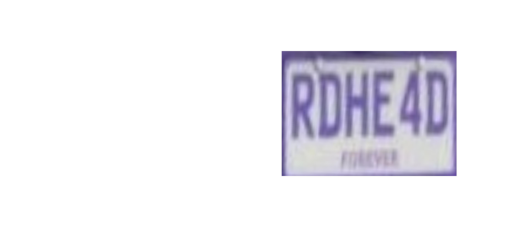

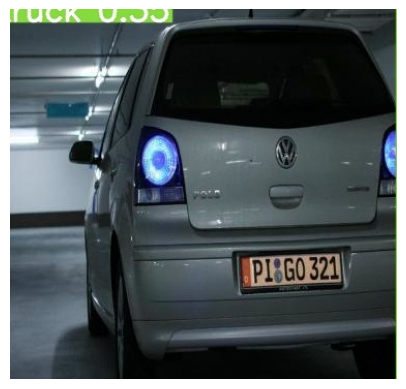

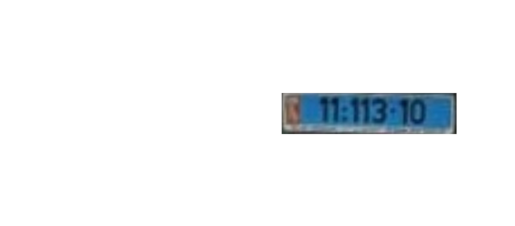

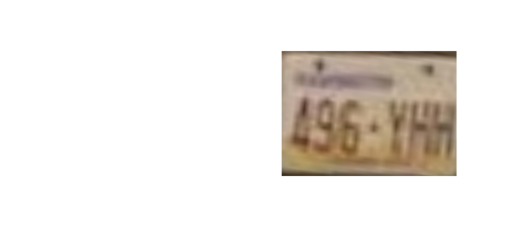

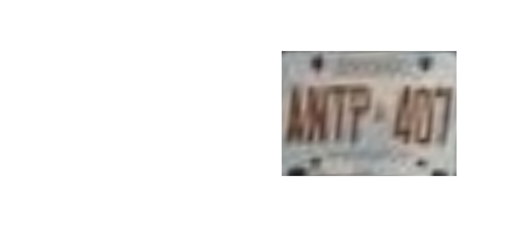

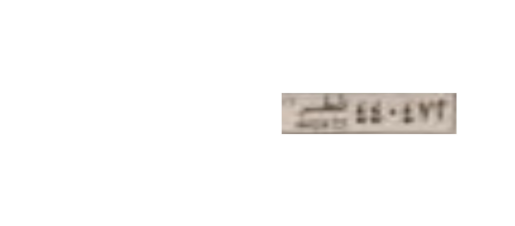

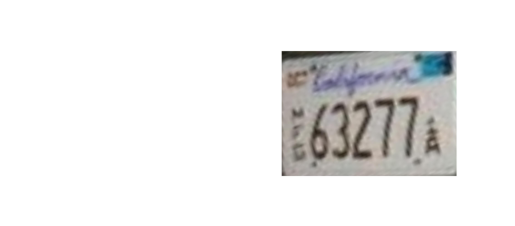

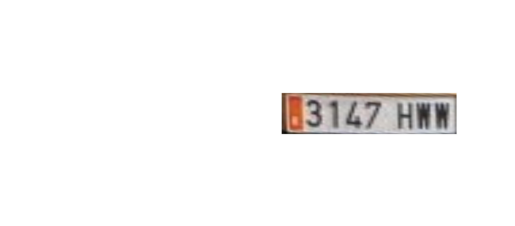

In [ ]:
i = 0
for filename in os.listdir("/content/"):
    i +=1
    if filename.endswith("jpg") and i<10:
        img_loop = Image.open(f"/content/{filename}")
        #img_loop.show()
        img_loop = np.array(img_loop)
        plt.imshow(img_loop)
        plt.axis("off")
        plt.show()


1/1 [==============================] - 0s 21ms/step
Coordinate of plate(s) in image: 
 [array([[        219,      319.68,      321.03,      220.34],
       [     236.76,      233.18,      268.32,       271.9],
       [          1,           1,           1,           1]])]


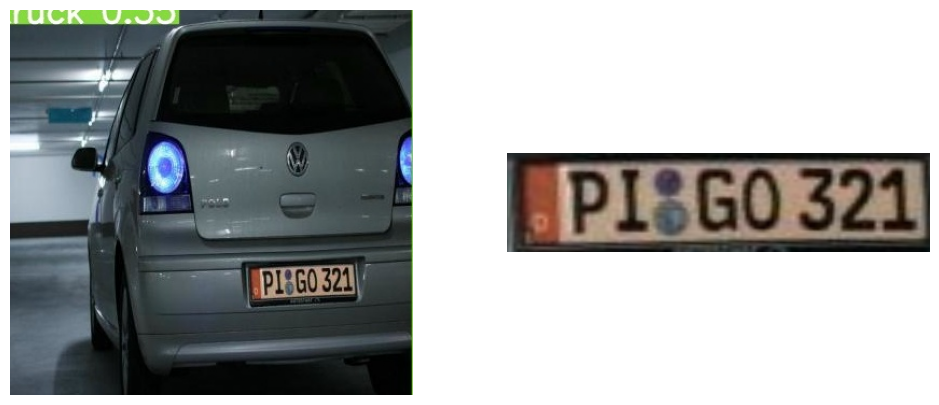

In [ ]:
test_image = img
LpImg,cor = get_plate(test_image)
#print("Detect %i plate(s) in"%len(LpImg),splitext(basename(test_image))[0])
print("Coordinate of plate(s) in image: \n", cor)

%matplotlib inline
import matplotlib.pyplot as plt

# Visualize our result
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.axis(False)
plt.imshow(preprocess_image(test_image))
plt.subplot(1,2,2)
plt.axis(False)
plt.imshow(LpImg[0])
plt.savefig("part2_result.jpg",dpi=300)




**Testing for Part 2.1**

Checking how many images actually returned an image of a license plate by checking if there is any level of text in the picture. This checking of the accuracy is more of a sanity check and uses the baseline model concept.

In [ ]:
!sudo apt install tesseract-ocr
!pip install opencv-python
!pip install pytesseract

import cv2
import pytesseract


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 15 not upgraded.
Need to get 4,816 kB of archives.
After this operation, 15.6 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-eng all 1:4.00~git30-7274cfa-1.1 [1,591 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-osd all 1:4.00~git30-7274cfa-1.1 [2,990 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr amd64 4.1.1-2.1build1 [236 kB]
Fetched 4,816 kB in 3s (1,696 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debc

1/1 [==============================] - 0s 24ms/step
area: 69.5, max area: 69.5, ratio: 1.6
area: 288.0, max area: 288.0, ratio: 2.0
area: 288.0, max area: 288.0, ratio: 2.0
area: 288.0, max area: 288.0, ratio: 2.0
area: 282.0, max area: 288.0, ratio: 2.0
area: 289.0, max area: 289.0, ratio: 2.0
area: 286.0, max area: 289.0, ratio: 2.0
area: 288.0, max area: 289.0, ratio: 2.0
area: 282.0, max area: 289.0, ratio: 2.0
area: 278.0, max area: 289.0, ratio: 2.1538461538461537
area: 475.0, max area: 475.0, ratio: 1.3333333333333333
area: 324.5, max area: 475.0, ratio: 1.6363636363636365
area: 734.0, max area: 734.0, ratio: 1.4615384615384615
area: 724.0, max area: 734.0, ratio: 1.4615384615384615
area: 726.0, max area: 734.0, ratio: 1.4615384615384615
area: 724.0, max area: 734.0, ratio: 1.52
area: 386.0, max area: 734.0, ratio: 1.52
area: 730.0, max area: 734.0, ratio: 1.4615384615384615
area: 726.0, max area: 734.0, ratio: 1.4615384615384615
area: 373.0, max area: 734.0, ratio: 1.5416666666

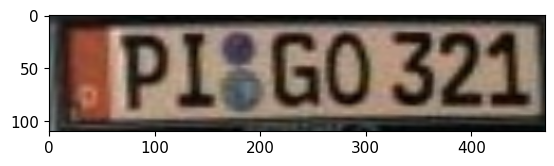

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np
import pytesseract

LpImg,cor = get_plate(test_image)
# Visualize our result
plt.imshow(LpImg[0])
plt.savefig("part2_result_test.jpg",dpi=300)

# img = cv2.imread("dwLFQ.png", cv2.IMREAD_COLOR)
#img_check = cv2.imread("/content/d9fa2abf3719a4bd_jpg.rf.b23a4781435fb7973f2d6afb66c1a169.jpg12.jpgpart2.jpg", cv2.IMREAD_COLOR)
img_check = cv2.imread("/content/part2_result_test.jpg", cv2.IMREAD_COLOR)
# img = cv2.imread("xTH6s.png", cv2.IMREAD_COLOR)

gray = cv2.cvtColor(img_check, cv2.COLOR_BGR2GRAY)
thresh = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]

items = cv2.findContours(thresh, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
contours = items[0] if len(items) == 2 else items[1]

base = np.zeros(thresh.shape, dtype=np.uint8)
base = cv2.bitwise_not(base)

max_area = 0
for i in range(len(contours)):
    x, y, w, h = cv2.boundingRect(contours[i])
    ratio = h / w
    area = cv2.contourArea(contours[i])
    cv2.drawContours(img, [contours[i]], 0, (255, 0, 0), 2)

    if 1 < ratio < 3:
        max_area = max(area, max_area)
        print("area: " + str(area) + ", max area: " + str(max_area) + ", ratio: " + str(ratio))
        # if 1000 < area < max_area / 2:
        if 1000 < area < 40000:
            mask = np.zeros(thresh.shape, dtype=np.uint8)
            cv2.drawContours(mask, [contours[i]], -1, color=255, thickness=-1)
            mean = cv2.mean(thresh, mask=mask)

            segment = np.zeros((h, w), dtype=np.uint8)
            segment[:h, :w] = thresh[y:y + h, x:x + w]

            if mean[0] > 150:
                # white, invert
                segment = cv2.bitwise_not(segment)

            base[y:y + h, x:x + w] = segment[:h, :w]
            #cv2_imshow(base)

            cv2.drawContours(img, [contours[i]], 0, (255, 0, 0), 2)

            cv2.waitKey(0)

custom_config = r'-l eng --oem 3 --psm 6 -c tessedit_char_whitelist="ABCDEFGHIJKLMNOPQRSTUVWXYZ " '
text = pytesseract.image_to_string(base, config=custom_config)
print(text)
text
print(len(text))

#cv2_imshow(img)
#cv2_imshow(base)

cv2.waitKey(0)
cv2.destroyAllWindows()

if len(text) > 0:
  print("There is a license plate in this picture!")

**Testing for Part 2.2**

The below pic was the test image used in the above code

(-0.5, 1919.5, 1439.5, -0.5)

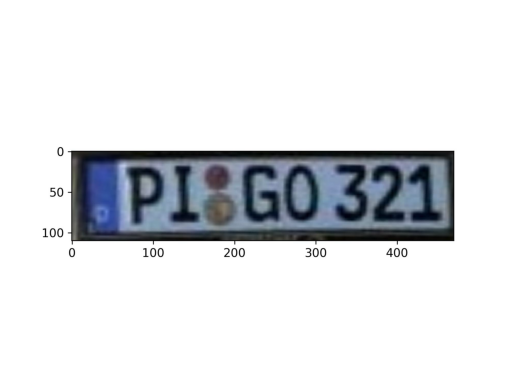

In [ ]:
#img = cv2.imread("/content/d9fa2abf3719a4bd_jpg.rf.b23a4781435fb7973f2d6afb66c1a169.jpg12.jpgpart2.jpg")
img = cv2.imread("/content/part2_result_test.jpg")
plt.imshow(img)
plt.axis("off")

In [ ]:
acc = 0
total = 0
for filename in os.listdir("/content/"):
    if filename.endswith("jpg"):
        total +=1
        img_lp = cv2.imread(f"/content/{filename}",cv2.IMREAD_COLOR)


        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        thresh = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]

        items = cv2.findContours(thresh, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
        contours = items[0] if len(items) == 2 else items[1]

        base = np.zeros(thresh.shape, dtype=np.uint8)
        base = cv2.bitwise_not(base)

        max_area = 0
        for i in range(len(contours)):
            x, y, w, h = cv2.boundingRect(contours[i])
            ratio = h / w
            area = cv2.contourArea(contours[i])
            cv2.drawContours(img, [contours[i]], 0, (255, 0, 0), 2)

            if 1 < ratio < 3:
                max_area = max(area, max_area)
                print("area: " + str(area) + ", max area: " + str(max_area) + ", ratio: " + str(ratio))
                # if 1000 < area < max_area / 2:
                if 1000 < area < 40000:
                    mask = np.zeros(thresh.shape, dtype=np.uint8)
                    cv2.drawContours(mask, [contours[i]], -1, color=255, thickness=-1)
                    mean = cv2.mean(thresh, mask=mask)

                    segment = np.zeros((h, w), dtype=np.uint8)
                    segment[:h, :w] = thresh[y:y + h, x:x + w]

                    if mean[0] > 150:
                        # white, invert
                        segment = cv2.bitwise_not(segment)

                    base[y:y + h, x:x + w] = segment[:h, :w]
                    #cv2_imshow(base)

                    cv2.drawContours(img, [contours[i]], 0, (255, 0, 0), 2)

                    cv2.waitKey(0)

        custom_config = r'-l eng --oem 3 --psm 6 -c tessedit_char_whitelist=".0123456789ABCDEFGHIJKLMNOPQRSTUVWXYZ " '
        text = pytesseract.image_to_string(base, config=custom_config)
        print(text)
        if len(text) > 1:
          acc +=1
        else:
          continue

        #cv2_imshow(img)
        #cv2_imshow(base)

        cv2.waitKey(0)
        cv2.destroyAllWindows()







In [ ]:
accuracy = acc/total * 100
print(accuracy)

Although this is a low accuracy, this accuracy is more of a sanity check. As long as the accuracy is greater than 5%, and the user has taken a quick look at the results, it is fine to continue on.

**Character Segmentation:**

In [ ]:
#CHARACTER SEG part 1

import numpy as np
import cv2
import matplotlib.pyplot as plt

def get_contourLargest(charac_dim, image):

  input_binImg = image.copy()
  #Mode: Retrieve all cont keeping nested cont hierarchy
  retr_reconsHierarchy = cv2.RETR_TREE
  contApproxMethod_endpoints = cv2.CHAIN_APPROX_SIMPLE

  #List of cont then find the dim
  contours, _ = cv2.findContours(input_binImg, retr_reconsHierarchy, contApproxMethod_endpoints)
  x_low, x_top, y_low, y_top = charac_dim
  contours = sorted(contours, key=lambda con: cv2.contourArea(con), reverse=True)[:15]

  img_rect = cv2.imread('/content/part2_result_test.jpg')
  xpos_detectedCont, results_img = [], []

  #Loop over contour list,
  #extract bounded rect's coordi from binary img(i.e. they depict the rectangle enclosed around contour)

  for each_contr in contours:
      x_topleft, y_topleft, breadth, ht = cv2.boundingRect(each_contr)

      #append after filtering
      if (x_low < breadth < x_top) and (y_low < ht <y_top):
        print(f"Selected contour dimensions: ({x_topleft}, {y_topleft}, {breadth}, {ht})") #del1
        xpos_detectedCont.append(x_topleft)


        # 2D array filled with zeros.
        #Thenevery char extracted utilising the bounded region's location
        #Then resize accordingly
        duplicate_charImg = np.full((44,24), 0)
        extracted_charac = image[y_topleft:y_topleft+ht, x_topleft:x_topleft+breadth]
        extracted_charac= cv2.resize(extracted_charac,(20,40))

      #Around character detected in img , plot the rect
      # func(topleft corner coordi + bottom right corner coordi,
      #rectangle color BGR, rect border thickness)
        img_rect = cv2.rectangle(img_rect,(x_topleft ,y_topleft),
       (breadth + x_topleft, y_topleft + ht),(50, 21, 200),2)
      #plotting-> to reveal the lp characters, Gaussian blurring and
      #thresholding is done on the image
        plt.imshow(img_rect,cmap = 'gray')
      #predict the seg chars
        plt.title('Character Segmentation Sample Predicition')


      #Invert then resize to original
        extracted_charac =255 - extracted_charac # invert color
      #the dupli is first put in the centre of 2d array
        duplicate_charImg[2:42, 2:22] = extracted_charac
      # create a border around character. Pixel border
        duplicate_charImg[ 0:2, : ] =0
      #Slices where border applied on img placeholder, these slices
      #chosen based on placeholder size and border breadth
        duplicate_charImg[ :, 0:2] =0
        duplicate_charImg[ 42:44, :] =0
        duplicate_charImg[ :, 22:24] =0
        results_img.append(duplicate_charImg) #image of charac added to unsorted image charac list

  plt.show()
  #Sort charac in increasing order wrt x loc(the very left charac first)
  #zip function -> Pair contour list of x positions
  #with corresponding images result element.
  #Then sort pairs and zip(*) helps get the two list by unpacking the pairs that
  #we had sorted
  #xpos_detectedCont, results_img= (zip(*sorted(zip(xpos_detectedCont,results_img))))
  duplicate_resultsImg = []

  sortedlist_charidx = sorted(range(len(xpos_detectedCont)),key=lambda j: xpos_detectedCont[j])

  for eachIndex in sortedlist_charidx:
      duplicate_resultsImg.append(results_img[eachIndex])# stores character images according to their index
  results_img = np.array(duplicate_resultsImg)


  return results_img




In [ ]:
#Charac Seg part 2

#Combined technique of resizing while maining aspect ratio and
#utilising adaptive thresholding which is beneficial for images with varying
#light conditions

def get_characterSegs(img):
  width = img.shape[1]
  height = img.shape[0]
  img_aspectRatio = width/height
  width_desired = 320
  #Maintain aspect ratio
  hgt = width_desired/img_aspectRatio
  height_desired = int(hgt)

  #Cropped LP image Preprocessing
  Licenplate_image= (cv2.resize(img, (width_desired, height_desired)))
  #Covert resized img to grayscale
  Licenplate_grayimage = (cv2.cvtColor(Licenplate_image, cv2.COLOR_BGR2GRAY))

  #Adaptive thresholding beneficial for images with varying light conditions
  Licenplate_binimage= cv2.adaptiveThreshold(Licenplate_grayimage,255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11,2)
  #Reduce noise and enhance imp features
  #T 2,2 kernel
  Licenplate_binimage= cv2.erode(Licenplate_binimage, (2,2))
  Licenplate_binimage= cv2.dilate(Licenplate_binimage, (2,2))

  width_LicenPlate= Licenplate_binimage.shape[0]
  height_LicenPlate= Licenplate_binimage.shape[1]
  #Borders -> color to white  , T 3.1
  sizeofBor = 2
  Licenplate_binimage[0:sizeofBor,:]= 255
  Licenplate_binimage[:,0:sizeofBor]= 255
  Licenplate_binimage[(height_desired-sizeofBor):height_desired, :] = 255
  Licenplate_binimage[:, (width_desired-sizeofBor):width_desired] = 255
  #dim of cont char
  cont_size= [(width_LicenPlate/7), (width_LicenPlate/2), (height_LicenPlate/10), 2*height_LicenPlate/3]

  plt.imshow(Licenplate_binimage, cmap='gray')
  plt.title('Resultant Contr')
  plt.show()
  cv2.imwrite('/content/part2_result_test.jpg', Licenplate_binimage)

  result_getcontour = get_contourLargest(cont_size, Licenplate_binimage)
  return result_getcontour





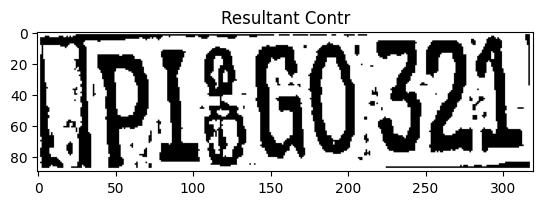

Selected contour dimensions: (174, 6, 32, 74)
Selected contour dimensions: (38, 14, 35, 75)
Selected contour dimensions: (107, 9, 29, 79)
Selected contour dimensions: (140, 8, 34, 75)
Selected contour dimensions: (250, 5, 32, 74)
Selected contour dimensions: (218, 5, 31, 74)
Selected contour dimensions: (282, 2, 33, 77)
Selected contour dimensions: (78, 11, 28, 74)
Selected contour dimensions: (183, 17, 16, 53)


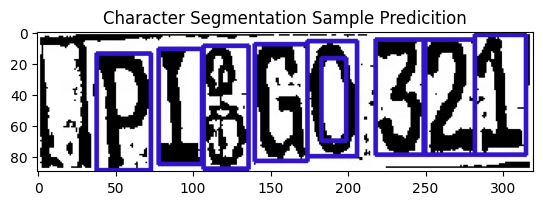

Final Result of Character Segmentation


In [ ]:
######   OUTPUT ####################### ??????????????????
part3_img = cv2.imread("/content/test.jpg")
cropSegm_characters = get_characterSegs(part3_img)
#print(cropSegm_characters)

#Final Step of Character Segmentation
print("Final Result of Character Segmentation")
# Testing

**Testing for Part 3.1 Character Segmentation Above Image**

Final Result of Character Segmentation


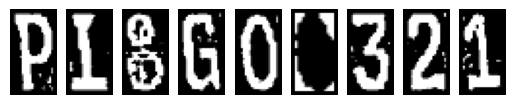

In [ ]:
#Final Step of Character Segmentation and part 3 of Trial 3.1

print("Final Result of Character Segmentation")

for j in range(len(cropSegm_characters)):
    plt.subplot(1, len(cropSegm_characters), j+1)
    plt.imshow(cropSegm_characters[j], cmap='gray')
    plt.axis('off')
#Show final char seg
plt.savefig("part3_result.jpg",dpi=300)
plt.show()

**Testing for Part 3.2 Character Segmentation Above Image**

Optical Character Recognition:

In [ ]:
import torch.nn as nn
from math import floor
import torch.nn.functional as F

In [ ]:
!pip install tensorflow
import tensorflow
import argparse
import cv2
import numpy as np
import keras
from keras.models import load_model
#from keras.preprocessing.image import img_to_array
from tensorflow.keras.utils import img_to_array
import functools


In [ ]:
#option 2
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Dense, Dropout, Activation, Flatten
from keras.optimizers import  Adam
from keras import metrics
from sklearn.metrics import f1_score


model = Sequential()
model.add(Conv2D(16, (20,20), input_shape=(28, 28, 3), activation='relu', padding='same'))
model.add(Conv2D(32, (8,8), input_shape=(28, 28, 3), activation='relu', padding='same'))
model.add(Conv2D(64, (4,4), input_shape=(28, 28, 3), activation='relu', padding='same'))
#model.add(Conv2D(64, (4,4), input_shape=(28, 28, 3), activation='relu', padding='same'))
model.add(MaxPooling2D(pool_size=(4, 4)))
model.add(Dropout(0.4))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dense(36, activation='softmax'))

model.compile(loss='sparse_categorical_crossentropy', optimizer=keras.optimizers.Adam(learning_rate=0.0001), metrics='accuracy')


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

#path= '/content/drive/My Drive/Colab Notebooks/data'
path = "/content/drive/MyDrive/Colab Notebooks/data/data"


Mounted at /content/drive


In [ ]:
from keras.preprocessing.image import ImageDataGenerator
datagen = ImageDataGenerator(rescale= 1./255, width_shift_range = 0.1, height_shift_range= 0.1 )
train_generator  = datagen.flow_from_directory(path+ '/train',
                                                 target_size = (28,28),
                                                 batch_size = 1,
                                                 class_mode = 'sparse')


validation_generator  = datagen.flow_from_directory(path+ '/val',
                                                 target_size = (28,28),
                                                 batch_size = 1,
                                                 class_mode = 'sparse')

Found 864 images belonging to 36 classes.
Found 216 images belonging to 36 classes.


In [ ]:
batch_size = 1

output = model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs = 20, verbose = 1, callbacks = None)

Epoch 1/20
864/864 [==============================] - 298s 342ms/step - loss: 2.8757 - accuracy: 0.2222 - val_loss: 1.4511 - val_accuracy: 0.5509
Epoch 2/20
864/864 [==============================] - 33s 38ms/step - loss: 1.1459 - accuracy: 0.6343 - val_loss: 0.7646 - val_accuracy: 0.7824
Epoch 3/20
864/864 [==============================] - 32s 38ms/step - loss: 0.6479 - accuracy: 0.7940 - val_loss: 0.3212 - val_accuracy: 0.9306
Epoch 4/20
864/864 [==============================] - 33s 39ms/step - loss: 0.4639 - accuracy: 0.8634 - val_loss: 0.3015 - val_accuracy: 0.9213
Epoch 5/20
864/864 [==============================] - 34s 39ms/step - loss: 0.3357 - accuracy: 0.8854 - val_loss: 0.2909 - val_accuracy: 0.8981
Epoch 6/20
864/864 [==============================] - 32s 38ms/step - loss: 0.2617 - accuracy: 0.9213 - val_loss: 0.2183 - val_accuracy: 0.9259
Epoch 7/20
864/864 [==============================] - 32s 37ms/step - loss: 0.2630 - accuracy: 0.9213 - val_loss: 0.2081 - val_accurac

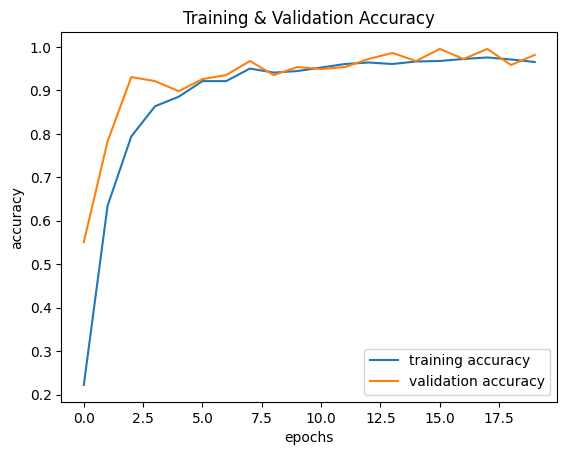

In [ ]:
import matplotlib.pyplot as plt # for plotting
plt.title("Training & Validation Accuracy")
plt.plot(output.history['accuracy'], label = 'training accuracy')
plt.plot(output.history['val_accuracy'], label = 'validation accuracy')
plt.xlabel('epochs')
plt.ylabel('accuracy')
plt.legend()

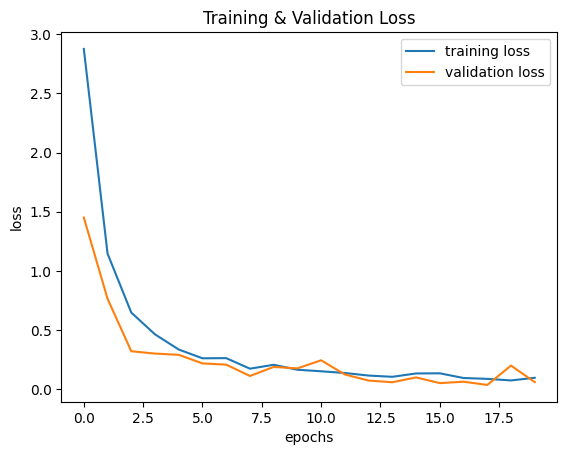

In [ ]:
plt.title("Training & Validation Loss")
plt.plot(output.history['loss'], label = 'training loss')
plt.plot(output.history['val_loss'], label = 'validation loss')
plt.xlabel('epochs')
plt.ylabel('loss')
plt.legend()

In [ ]:
model.save_weights('/content/drive/My Drive/Colab Notebooks/APS 360/weights')

In [ ]:
#img = cv2.imread("/content/part3_result.jpg")
#img = np.array(img)

In [ ]:
# code inspiration - https://github.com/pragatiunna/License-Plate-Number-Detection/blob/main/2.%20License%20Plate%20Detection%20(using%20YOLOv3).ipynb
def fix_dim(img):
  new = np.zeros((28,28,3))
  for i in range(3):
    new[:,:,i]=img
    return new

def test():
  track = {}
  chars = '0123456789ABCDEFGHIJKLMNOPQRSTUVWXYZ'
  for i,j in enumerate(chars):
    track[i]=j

  result = []

  for i,j in enumerate(chars):
    img = cv2.resize(j, (28,28), interpolation = cv2.INTER_AREA)
    img = fix_dim(img)
    img = img.reshape(1,28,28,3)
    y = model.predict_classes('/content/License-Plates-3/test')
    char = track[y]
    result.append(char)


  licence_plate = ''.join(result)

  return licence_plate

print(test)


PI8G00321


**Testing for Part 4 Character Recognition**

In [ ]:
labels=pd.read_excel('/content/drive/MyDrive/APS360/APS360 Project - Group/Testing Dataset Labels.xlsx')
labels['Serial']=labels['Serial'].map(str)
labels

,Serial,Plate
0,1,SB JM 2006
1,2,NaN
2,3,BBX 3499
3,4,XF1521
4,5,BEHM 927
5,6,HVI3 OTP
6,7,NaN
7,8,GLENIE
8,9,NaN
9,10,UW 3932


In [ ]:
# Code source - https://github.com/pragatiunna/License-Plate-Number-Detection/blob/main/2.%20License%20Plate%20Detection%20(using%20YOLOv3).ipynb
list_path=('/content/License-Plates-3/test')
count=0
for path in list_path:
    no=path[:-4]
    row=labels['NUMBER'].where(labels['ID'] == no).dropna().values[0]
    image = cv2.imread('/content/License-Plates-3/test/'+path)
    # Resize the image - change width to 500
    image = imutils.resize(image, width=500)
    img=cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Processing
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    gray = cv2.bilateralFilter(gray, 11, 17, 17)
    edged = cv2.Canny(gray, 170, 200)
    cnts = cv2.findContours(edged.copy(), cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)[0]
    cnts=sorted(cnts, key = cv2.contourArea, reverse = True)[:30]
    NumberPlateCnt = None

    # loop over our contours to find the best possible approximate contour of number plate
    for c in cnts:
            peri = cv2.arcLength(c, True)
            approxPoly = cv2.approxPolyDP(c, 0.02 * peri, True)
            if len(approxPoly) == 4:
                NumberPlateC = approxPoly
                x,y,w,h = cv2.boundingRect(c)
                ROI = img[y:y+h, x:x+w]
                break

    idx=0
    m=0
    if NumberPlateCnt is None:
        continue
    for i in range(4):
        if NumberPlateCnt[i][0][1]>m:
            idx=i
            m=NumberPlateCnt[i][0][1]
    if idx==0:
        pin=3
    else:
        pin=idx-1
    if idx==3:
        nin=0
    else:
        nin=idx+1

    p=math.dist(NumberPlateCnt[idx][0][0], NumberPlateCnt[pin][0][0], NumberPlateCnt[idx][0][1], NumberPlateCnt[pin][0][1])
    n=math.dist(NumberPlateCnt[idx][0][0], NumberPlateCnt[nin][0][0], NumberPlateCnt[idx][0][1], NumberPlateCnt[nin][0][1])

    if p>n:
        if NumberPlateCnt[pin][0][0]<NumberPlateCnt[idx][0][0]:
            left=pin
            right=idx
        else:
            left=idx
            right=pin
        d=p
    else:
        if NumberPlateCnt[nin][0][0]<NumberPlateCnt[idx][0][0]:
            left=nin
            right=idx
        else:
            left=idx
            right=nin
        d=n
    left_x=NumberPlateCnt[left][0][0]
    left_y=NumberPlateCnt[left][0][1]
    right_x=NumberPlateCnt[right][0][0]
    right_y=NumberPlateCnt[right][0][1]

    opp=right_y-left_y
    hyp=((left_x-right_x)**2+(left_y-right_y)**2)**0.5
    sin=opp/hyp
    theta=math.asin(sin)*57.2958

    image_center = tuple(np.array(ROI.shape[1::-1]) / 2)
    rot_mat = cv2.getRotationMatrix2D(image_center, theta, 1.0)
    result = cv2.warpAffine(ROI, rot_mat, ROI.shape[1::-1], flags=cv2.INTER_LINEAR)

    if opp>0:
        h=result.shape[0]-opp//2
    else:
        h=result.shape[0]+opp//2

    result=result[0:h, :]
    char=get_CharacterSegs(result)
    count=test(count)
    print("Accuracy:"+str((count/166)*100))


Accuracy:77.7777777778


**Testing for Part 4 Overall Accuracy**